In [ ]:
!pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121

Looking in indexes: https://download.pytorch.org/whl/cu121
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 31.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 30.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 51.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 870.3 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
!pip install numpy matplotlib

In [ ]:
!pip install opendatasets --upgrade --quiet

In [ ]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/datasets/badasstechie/celebahq-resized-256x256'
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username:

In [ ]:
import os

DATA_DIR = '/content/celebahq-resized-256x256'
print(os.listdir(DATA_DIR))

In [ ]:
print(os.listdir(DATA_DIR+'/celeba_hq_256')[:10])

In [ ]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [ ]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

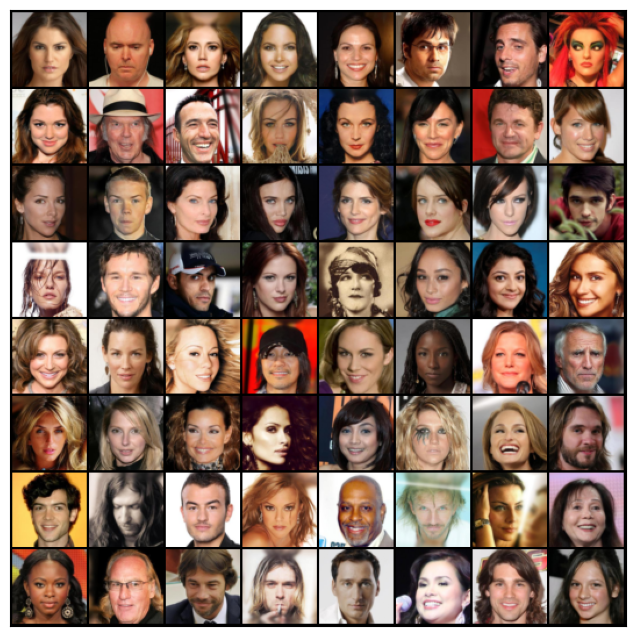

In [ ]:
show_batch(train_dl)

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

In [ ]:
import torch.nn as nn

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device)

In [ ]:
latent_size = 128

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


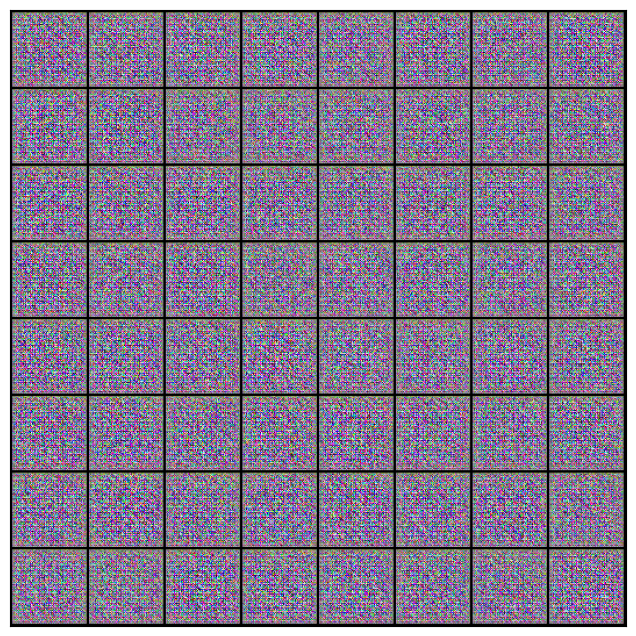

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator, device)

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


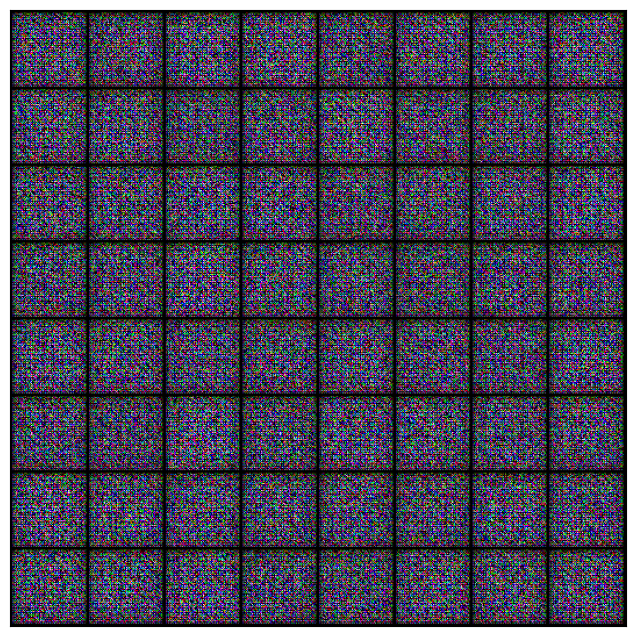

In [ ]:
save_samples(0, fixed_latent)

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.0002
epochs = 5

In [ ]:
history = fit(epochs, lr)

  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [1/100], loss_g: 3.2901, loss_d: 0.2458, real_score: 0.8524, fake_score: 0.0590
Saving generated-images-0001.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [2/100], loss_g: 1.9727, loss_d: 0.9474, real_score: 0.4855, fake_score: 0.0134
Saving generated-images-0002.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [3/100], loss_g: 6.7756, loss_d: 0.4243, real_score: 0.9924, fake_score: 0.2904
Saving generated-images-0003.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [4/100], loss_g: 6.1779, loss_d: 0.3130, real_score: 0.9858, fake_score: 0.2341
Saving generated-images-0004.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [5/100], loss_g: 4.2121, loss_d: 0.4247, real_score: 0.9549, fake_score: 0.2777
Saving generated-images-0005.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [6/100], loss_g: 3.7628, loss_d: 0.2639, real_score: 0.8802, fake_score: 0.1116
Saving generated-images-0006.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [7/100], loss_g: 3.4192, loss_d: 0.2507, real_score: 0.8827, fake_score: 0.1055
Saving generated-images-0007.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [8/100], loss_g: 3.7524, loss_d: 0.3562, real_score: 0.8653, fake_score: 0.1671
Saving generated-images-0008.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [9/100], loss_g: 3.4891, loss_d: 0.2298, real_score: 0.9397, fake_score: 0.1359
Saving generated-images-0009.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [10/100], loss_g: 4.0048, loss_d: 0.2010, real_score: 0.9818, fake_score: 0.1507
Saving generated-images-0010.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [11/100], loss_g: 2.5836, loss_d: 0.3030, real_score: 0.7604, fake_score: 0.0060
Saving generated-images-0011.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [12/100], loss_g: 4.0392, loss_d: 0.1087, real_score: 0.9330, fake_score: 0.0349
Saving generated-images-0012.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [13/100], loss_g: 4.7215, loss_d: 0.3651, real_score: 0.9290, fake_score: 0.2125
Saving generated-images-0013.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [14/100], loss_g: 2.3662, loss_d: 0.2620, real_score: 0.8668, fake_score: 0.0831
Saving generated-images-0014.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [15/100], loss_g: 5.1880, loss_d: 0.0673, real_score: 0.9880, fake_score: 0.0521
Saving generated-images-0015.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [16/100], loss_g: 6.8784, loss_d: 1.8860, real_score: 0.9836, fake_score: 0.7282
Saving generated-images-0016.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [17/100], loss_g: 3.7935, loss_d: 0.0925, real_score: 0.9884, fake_score: 0.0731
Saving generated-images-0017.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [18/100], loss_g: 3.3564, loss_d: 0.1260, real_score: 0.9026, fake_score: 0.0159
Saving generated-images-0018.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [19/100], loss_g: 2.3518, loss_d: 0.1975, real_score: 0.8669, fake_score: 0.0429
Saving generated-images-0019.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [20/100], loss_g: 4.9004, loss_d: 0.0637, real_score: 0.9946, fake_score: 0.0553
Saving generated-images-0020.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [21/100], loss_g: 4.6653, loss_d: 0.0526, real_score: 0.9672, fake_score: 0.0176
Saving generated-images-0021.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [22/100], loss_g: 3.4377, loss_d: 0.0608, real_score: 0.9840, fake_score: 0.0417
Saving generated-images-0022.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [23/100], loss_g: 1.3839, loss_d: 0.6551, real_score: 0.6876, fake_score: 0.1417
Saving generated-images-0023.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [24/100], loss_g: 3.4827, loss_d: 0.2612, real_score: 0.8781, fake_score: 0.0959
Saving generated-images-0024.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [25/100], loss_g: 1.6971, loss_d: 0.8532, real_score: 0.5929, fake_score: 0.1351
Saving generated-images-0025.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [26/100], loss_g: 3.8140, loss_d: 0.5215, real_score: 0.9771, fake_score: 0.3189
Saving generated-images-0026.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [27/100], loss_g: 4.7245, loss_d: 0.0968, real_score: 0.9641, fake_score: 0.0550
Saving generated-images-0027.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [28/100], loss_g: 0.5074, loss_d: 0.4824, real_score: 0.6599, fake_score: 0.0056
Saving generated-images-0028.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [29/100], loss_g: 4.2934, loss_d: 0.4067, real_score: 0.9031, fake_score: 0.2096
Saving generated-images-0029.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [30/100], loss_g: 4.6609, loss_d: 0.0887, real_score: 0.9480, fake_score: 0.0298
Saving generated-images-0030.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [31/100], loss_g: 5.1654, loss_d: 0.0746, real_score: 0.9875, fake_score: 0.0549
Saving generated-images-0031.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [32/100], loss_g: 5.4060, loss_d: 0.4823, real_score: 0.9957, fake_score: 0.3035
Saving generated-images-0032.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [33/100], loss_g: 3.2346, loss_d: 0.1160, real_score: 0.9783, fake_score: 0.0829
Saving generated-images-0033.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [34/100], loss_g: 1.9156, loss_d: 0.1415, real_score: 0.8876, fake_score: 0.0134
Saving generated-images-0034.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [35/100], loss_g: 2.9512, loss_d: 0.2067, real_score: 0.8531, fake_score: 0.0238
Saving generated-images-0035.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [36/100], loss_g: 4.8102, loss_d: 0.0728, real_score: 0.9896, fake_score: 0.0579
Saving generated-images-0036.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [37/100], loss_g: 4.2275, loss_d: 0.0718, real_score: 0.9689, fake_score: 0.0368
Saving generated-images-0037.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [38/100], loss_g: 2.3864, loss_d: 0.1107, real_score: 0.9205, fake_score: 0.0196
Saving generated-images-0038.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [39/100], loss_g: 4.8159, loss_d: 0.2786, real_score: 0.8890, fake_score: 0.1114
Saving generated-images-0039.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [40/100], loss_g: 3.4695, loss_d: 0.1370, real_score: 0.9163, fake_score: 0.0410
Saving generated-images-0040.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [41/100], loss_g: 4.7179, loss_d: 0.0492, real_score: 0.9714, fake_score: 0.0189
Saving generated-images-0041.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [42/100], loss_g: 3.7525, loss_d: 0.0508, real_score: 0.9663, fake_score: 0.0153
Saving generated-images-0042.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [43/100], loss_g: 4.4566, loss_d: 0.2638, real_score: 0.9510, fake_score: 0.1603
Saving generated-images-0043.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [44/100], loss_g: 4.0592, loss_d: 0.0844, real_score: 0.9535, fake_score: 0.0272
Saving generated-images-0044.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [45/100], loss_g: 2.9105, loss_d: 0.1974, real_score: 0.9579, fake_score: 0.1180
Saving generated-images-0045.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [46/100], loss_g: 5.0597, loss_d: 0.0433, real_score: 0.9783, fake_score: 0.0200
Saving generated-images-0046.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [47/100], loss_g: 3.4547, loss_d: 0.1775, real_score: 0.9441, fake_score: 0.0999
Saving generated-images-0047.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [48/100], loss_g: 6.1298, loss_d: 0.2149, real_score: 0.9777, fake_score: 0.1542
Saving generated-images-0048.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [49/100], loss_g: 2.7374, loss_d: 0.3041, real_score: 0.7703, fake_score: 0.0019
Saving generated-images-0049.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [50/100], loss_g: 4.3731, loss_d: 0.0717, real_score: 0.9626, fake_score: 0.0301
Saving generated-images-0050.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [51/100], loss_g: 5.8539, loss_d: 0.0787, real_score: 0.9466, fake_score: 0.0205
Saving generated-images-0051.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [52/100], loss_g: 7.9482, loss_d: 5.8564, real_score: 1.0000, fake_score: 0.9771
Saving generated-images-0052.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [53/100], loss_g: 4.8141, loss_d: 0.1528, real_score: 0.8924, fake_score: 0.0252
Saving generated-images-0053.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [54/100], loss_g: 5.7414, loss_d: 0.0540, real_score: 0.9520, fake_score: 0.0038
Saving generated-images-0054.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [55/100], loss_g: 4.0372, loss_d: 0.1410, real_score: 0.9208, fake_score: 0.0337
Saving generated-images-0055.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [56/100], loss_g: 5.1595, loss_d: 0.1972, real_score: 0.9258, fake_score: 0.0994
Saving generated-images-0056.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [57/100], loss_g: 4.8229, loss_d: 0.0446, real_score: 0.9908, fake_score: 0.0333
Saving generated-images-0057.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [58/100], loss_g: 4.7235, loss_d: 0.0575, real_score: 0.9762, fake_score: 0.0313
Saving generated-images-0058.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [59/100], loss_g: 3.5943, loss_d: 0.2152, real_score: 0.8570, fake_score: 0.0372
Saving generated-images-0059.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [60/100], loss_g: 4.0017, loss_d: 0.1229, real_score: 0.9284, fake_score: 0.0422
Saving generated-images-0060.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [61/100], loss_g: 1.4164, loss_d: 0.5465, real_score: 0.7412, fake_score: 0.1648
Saving generated-images-0061.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [62/100], loss_g: 4.8311, loss_d: 0.0925, real_score: 0.9670, fake_score: 0.0538
Saving generated-images-0062.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [63/100], loss_g: 3.6079, loss_d: 0.1051, real_score: 0.9454, fake_score: 0.0403
Saving generated-images-0063.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [64/100], loss_g: 5.3794, loss_d: 0.0323, real_score: 0.9877, fake_score: 0.0190
Saving generated-images-0064.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [65/100], loss_g: 6.3239, loss_d: 0.0303, real_score: 0.9778, fake_score: 0.0073
Saving generated-images-0065.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [66/100], loss_g: 1.7089, loss_d: 0.3178, real_score: 0.8137, fake_score: 0.0382
Saving generated-images-0066.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [67/100], loss_g: 4.3344, loss_d: 0.0532, real_score: 0.9785, fake_score: 0.0299
Saving generated-images-0067.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [68/100], loss_g: 5.5326, loss_d: 0.0224, real_score: 0.9922, fake_score: 0.0142
Saving generated-images-0068.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [69/100], loss_g: 4.0657, loss_d: 0.0933, real_score: 0.9479, fake_score: 0.0361
Saving generated-images-0069.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [70/100], loss_g: 3.4681, loss_d: 0.1236, real_score: 0.9021, fake_score: 0.0084
Saving generated-images-0070.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [71/100], loss_g: 5.7873, loss_d: 0.0713, real_score: 0.9732, fake_score: 0.0367
Saving generated-images-0071.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [72/100], loss_g: 3.3045, loss_d: 0.2467, real_score: 0.8286, fake_score: 0.0230
Saving generated-images-0072.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [73/100], loss_g: 5.3514, loss_d: 0.0214, real_score: 0.9897, fake_score: 0.0102
Saving generated-images-0073.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [74/100], loss_g: 9.0503, loss_d: 1.6966, real_score: 0.9997, fake_score: 0.6994
Saving generated-images-0074.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [75/100], loss_g: 6.4405, loss_d: 0.0199, real_score: 0.9973, fake_score: 0.0166
Saving generated-images-0075.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [76/100], loss_g: 4.2986, loss_d: 0.3923, real_score: 0.9371, fake_score: 0.2169
Saving generated-images-0076.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [77/100], loss_g: 5.6936, loss_d: 0.0987, real_score: 0.9859, fake_score: 0.0683
Saving generated-images-0077.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [78/100], loss_g: 4.8631, loss_d: 0.0714, real_score: 0.9446, fake_score: 0.0128
Saving generated-images-0078.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [79/100], loss_g: 4.2303, loss_d: 0.0720, real_score: 0.9711, fake_score: 0.0375
Saving generated-images-0079.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [80/100], loss_g: 4.1525, loss_d: 0.0939, real_score: 0.9308, fake_score: 0.0185
Saving generated-images-0080.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [81/100], loss_g: 5.1479, loss_d: 0.0320, real_score: 0.9820, fake_score: 0.0133
Saving generated-images-0081.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [82/100], loss_g: 3.1892, loss_d: 0.8548, real_score: 0.5617, fake_score: 0.0042
Saving generated-images-0082.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [83/100], loss_g: 5.3515, loss_d: 0.1233, real_score: 0.9747, fake_score: 0.0837
Saving generated-images-0083.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [84/100], loss_g: 4.1519, loss_d: 0.0538, real_score: 0.9917, fake_score: 0.0423
Saving generated-images-0084.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [85/100], loss_g: 5.2573, loss_d: 0.1366, real_score: 0.8941, fake_score: 0.0149
Saving generated-images-0085.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [86/100], loss_g: 6.3296, loss_d: 0.0273, real_score: 0.9848, fake_score: 0.0111
Saving generated-images-0086.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [87/100], loss_g: 3.4295, loss_d: 0.5111, real_score: 0.8497, fake_score: 0.2490
Saving generated-images-0087.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [88/100], loss_g: 1.9204, loss_d: 0.5999, real_score: 0.6292, fake_score: 0.0276
Saving generated-images-0088.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [89/100], loss_g: 4.0409, loss_d: 0.0885, real_score: 0.9422, fake_score: 0.0244
Saving generated-images-0089.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [90/100], loss_g: 4.3789, loss_d: 0.0818, real_score: 0.9301, fake_score: 0.0041
Saving generated-images-0090.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [91/100], loss_g: 2.3536, loss_d: 0.1252, real_score: 0.9266, fake_score: 0.0392
Saving generated-images-0091.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [92/100], loss_g: 3.7569, loss_d: 0.2098, real_score: 0.9052, fake_score: 0.0790
Saving generated-images-0092.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [93/100], loss_g: 5.6677, loss_d: 0.1222, real_score: 0.9979, fake_score: 0.1014
Saving generated-images-0093.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [94/100], loss_g: 5.2867, loss_d: 0.1584, real_score: 0.9411, fake_score: 0.0784
Saving generated-images-0094.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [95/100], loss_g: 5.6896, loss_d: 0.1028, real_score: 0.9813, fake_score: 0.0688
Saving generated-images-0095.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [96/100], loss_g: 1.4952, loss_d: 0.9979, real_score: 0.4877, fake_score: 0.0553
Saving generated-images-0096.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [97/100], loss_g: 3.1609, loss_d: 0.1734, real_score: 0.8889, fake_score: 0.0418
Saving generated-images-0097.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [98/100], loss_g: 5.8954, loss_d: 0.0699, real_score: 0.9537, fake_score: 0.0184
Saving generated-images-0098.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [99/100], loss_g: 3.1832, loss_d: 0.1095, real_score: 0.9538, fake_score: 0.0524
Saving generated-images-0099.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [100/100], loss_g: 3.9259, loss_d: 0.0727, real_score: 0.9418, fake_score: 0.0085
Saving generated-images-0100.png


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [ ]:
from IPython.display import Image

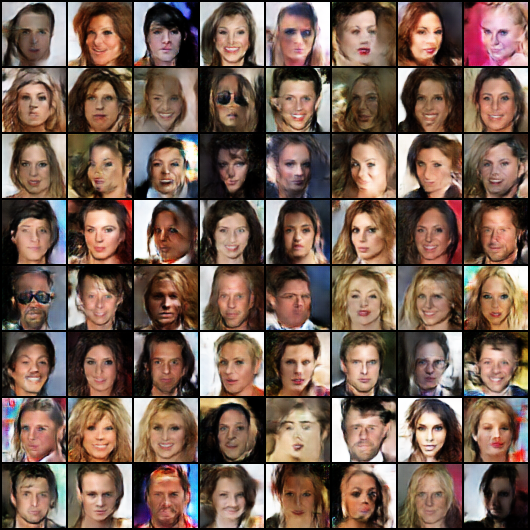

In [ ]:
Image('./generated/generated-images-0001.png')

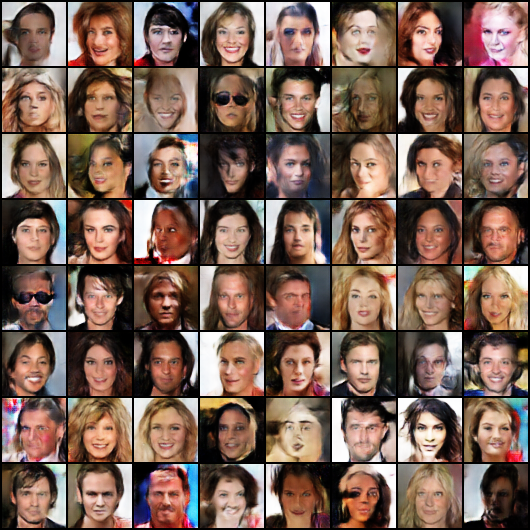

In [ ]:
Image('./generated/generated-images-0005.png')

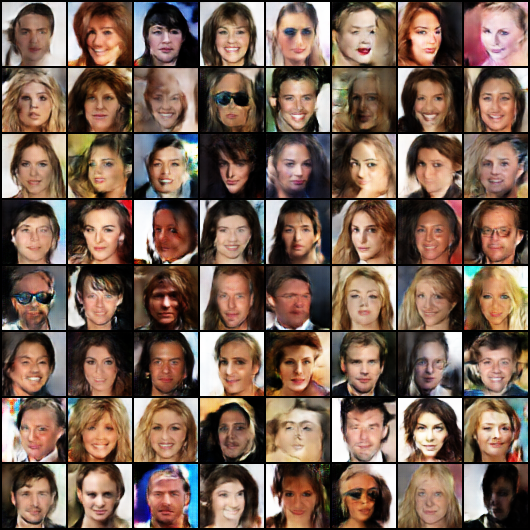

In [ ]:
Image('./generated/generated-images-0010.png')

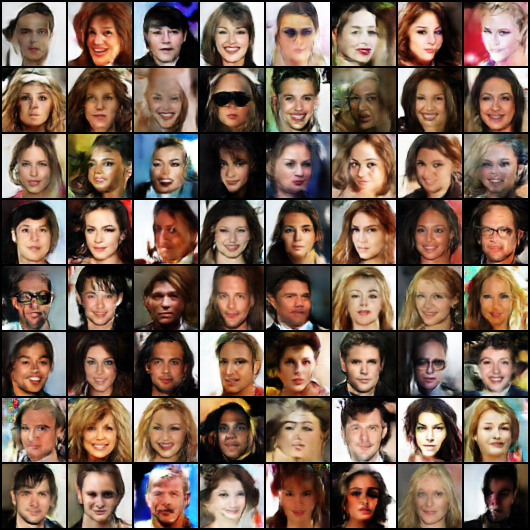

In [ ]:
Image('./generated/generated-images-0020.png')

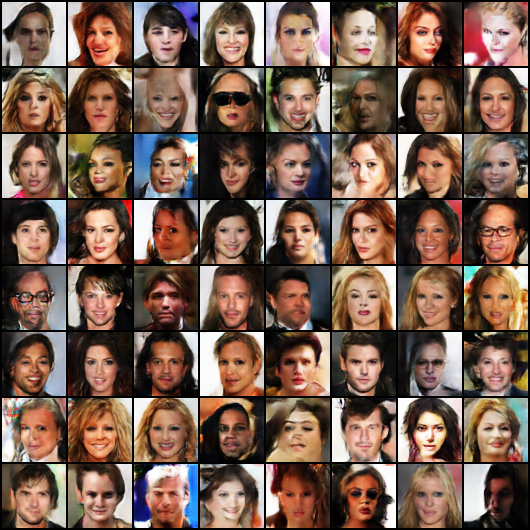

In [ ]:
Image('./generated/generated-images-0025.png')

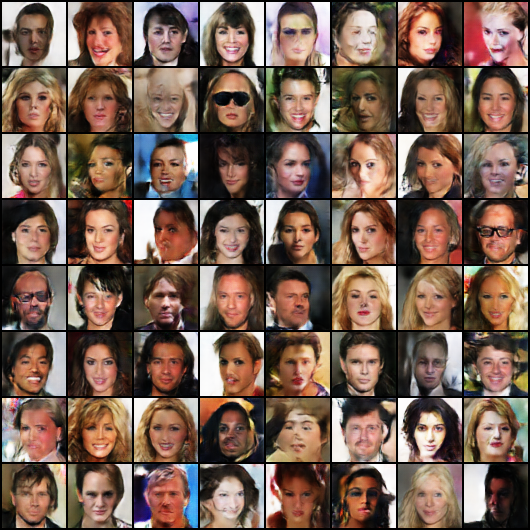

In [ ]:
Image('./generated/generated-images-0035.png')

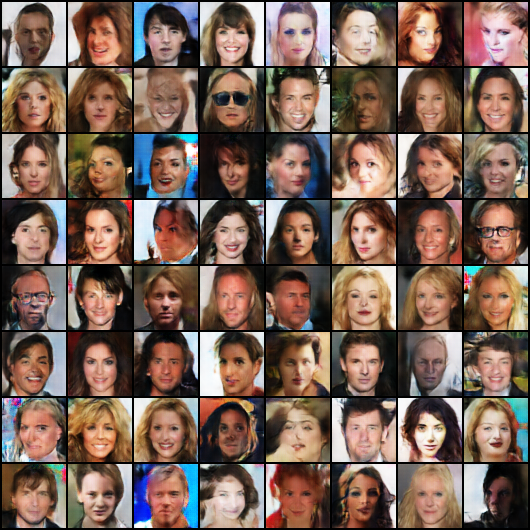

In [ ]:
Image('./generated/generated-images-0045.png')


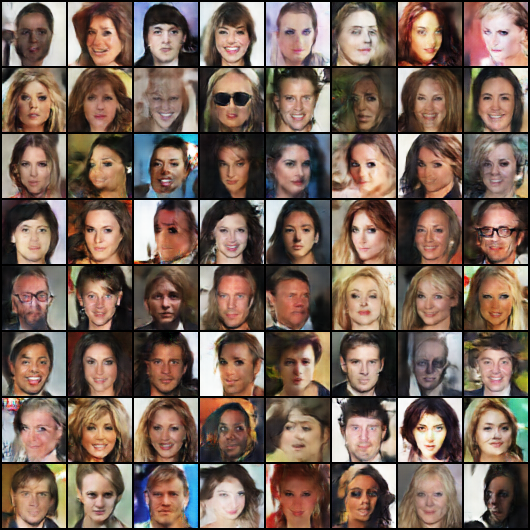

In [ ]:
Image('./generated/generated-images-0055.png')

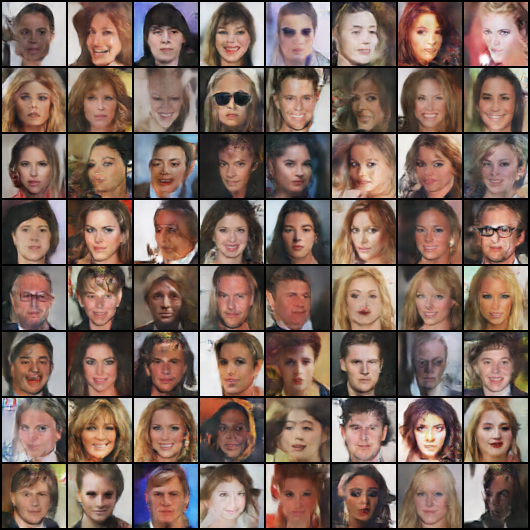

In [ ]:
Image('./generated/generated-images-0075.png')

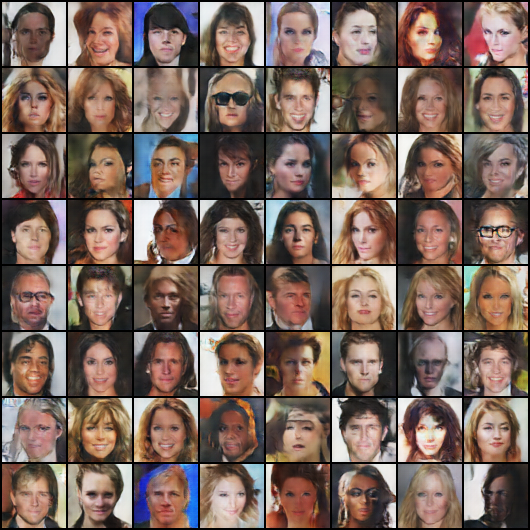

In [ ]:
Image('./generated/generated-images-0099.png')

In [ ]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

NameError: name 'sample_dir' is not defined

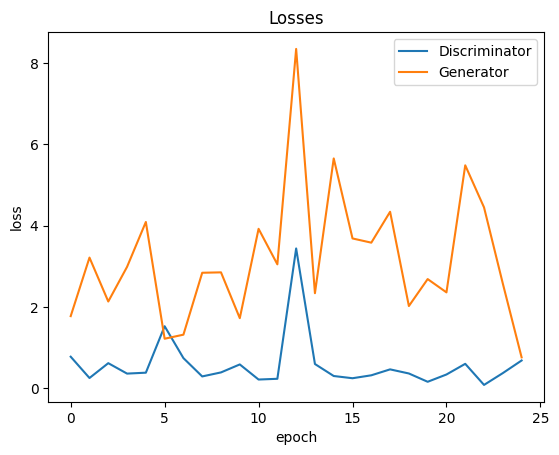

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

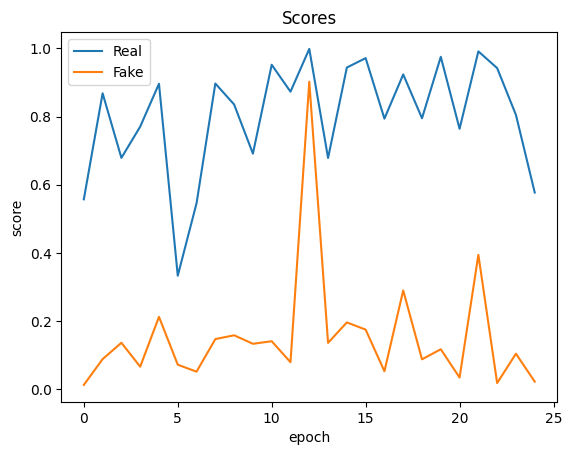

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');